<a href="https://colab.research.google.com/github/pejmanrasti/Formation_institut_optique/blob/main/4_object_detection_Yolov11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import pandas as pd
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

!pip install ultralytics
from ultralytics import YOLO

## Yolov11

In [ ]:
# Détection : YOLO11
# yolo11n.pt yolo11s.pt yolo11m.pt yolo11l.pt yolo11x.pt

# YOLO11-cls : Classification
# yolo11n-cls.pt yolo11s-cls.pt yolo11m-cls.pt yolo11l-cls.pt yolo11x-cls.pt

# Instance segmentation : YOLO11-seg
# yolo11n-seg.pt yolo11s-seg.pt yolo11m-seg.pt yolo11l-seg.pt yolo11x-seg.pt

# YOLO11-pose	: Pose/Points clés
# yolo11n-pose.pt yolo11s-pose.pt yolo11m-pose.pt yolo11l-pose.pt yolo11x-pose.pt

# YOLO11-obb : Détection orientée
# yolo11n-obb.pt yolo11s-obb.pt yolo11m-obb.pt yolo11l-obb.pt yolo11x-obb.pt

### ***Detection***

#### Train

In [ ]:
from ultralytics import YOLO

# Load a model
# model = YOLO("yolo11n.yaml")  # build a new model from YAML (from scratch)
# model = YOLO("yolo11n.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

# Train the model with 1 GPU
results = model.train(data="coco8.yaml", epochs=100, imgsz=640, device=[0])
# # Train the model with 2 GPUs
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640, device=[0, 1])
# # Train the model with MPS (recommanded for Apple user)
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640, device="mps")

#### Validation

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)  # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75
print(metrics.box.maps)  # a list contains map50-95 of each category

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


val: Scanning /content/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.91it/s]


                   all          4         17      0.637      0.942      0.909      0.647
                person          3         10      0.625        0.7      0.644      0.323
                   dog          1          1      0.524          1      0.995      0.796
                 horse          1          2      0.551          1      0.995       0.65
              elephant          1          2      0.651      0.952      0.828      0.322
              umbrella          1          1      0.556          1      0.995      0.895
          potted plant          1          1      0.918          1      0.995      0.895
Speed: 0.5ms preprocess, 19.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train22
0.6470823227823517
0.9086890397184515
0.7133031674208145
[    0.32338     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708     0.64708       0

#### Inference


Found https://upload.wikimedia.org/wikipedia/commons/d/d1/Claude_Francois_1965-1.jpg locally at Claude_Francois_1965-1.jpg
image 1/1 /content/Claude_Francois_1965-1.jpg: 640x640 2 persons, 1 tie, 2 potted plants, 9.0ms


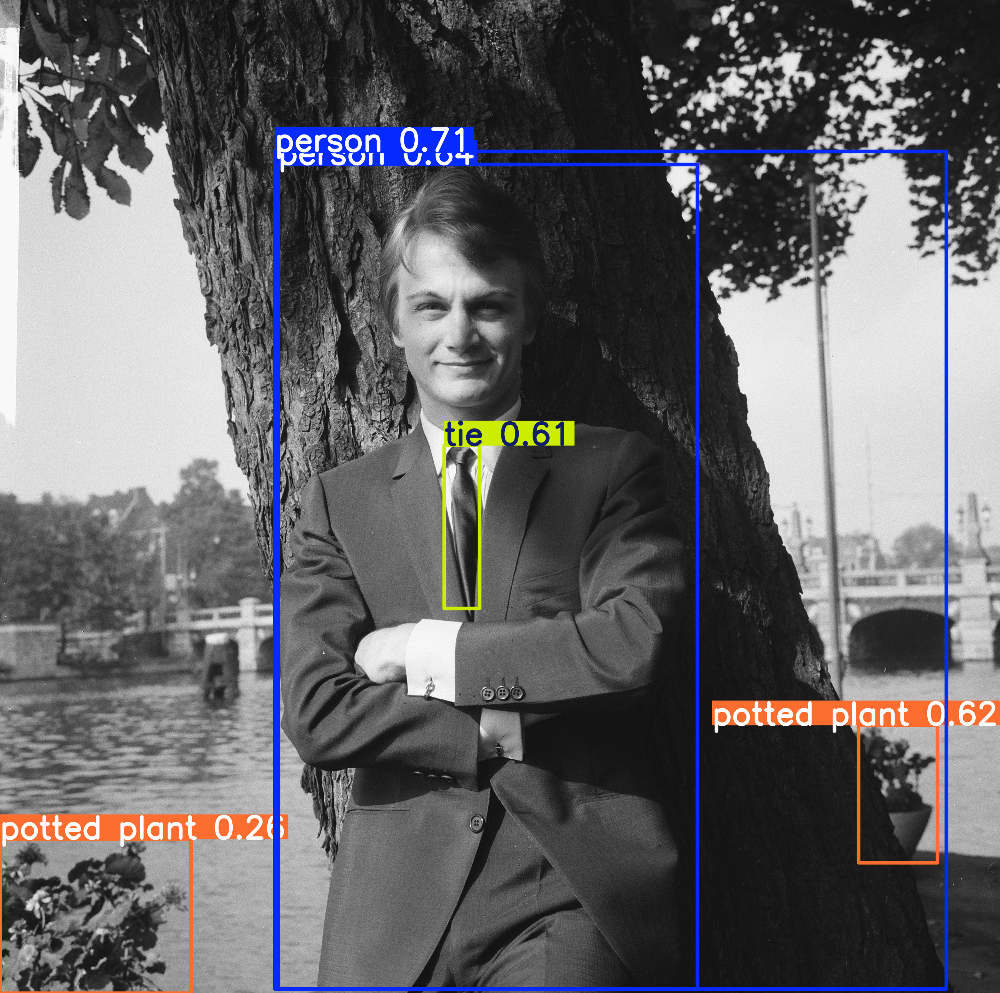

Speed: 3.4ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
model = YOLO("/content/runs/detect/train2/weights/best.pt")
results = model("https://upload.wikimedia.org/wikipedia/commons/d/d1/Claude_Francois_1965-1.jpg", stream=True)  # inference on image
# results = model(["im1.jpg","im2.jpg"], stream=True)  # inference on a set of image

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename='result_'+os.path.basename(result.path))  # save to disk

### ***Segmentation***

#### Train

In [ ]:
from ultralytics import YOLO

# # Load a model
# model = YOLO("yolo11n-seg.yaml")  # build a new model from YAML
# model = YOLO("yolo11n-seg.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n-seg.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

# Train the model with 1 GPU
results = model.train(data="coco8-seg.yaml", epochs=100, imgsz=640)
# # Train the model with 2 GPUs
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640, device=[0, 1])
# # Train the model with MPS (recommanded for Apple user)
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640, device="mps")

#### Validation

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)  # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75
print(metrics.box.maps)  # a list contains map50-95 of each category

#### Test

In [ ]:
model = YOLO("yolo11n-seg.pt")
results = model("https://scontent-cdg4-1.xx.fbcdn.net/v/t39.30808-6/467244175_900161628929760_3142736701958668515_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=127cfc&_nc_ohc=znjATmRznk8Q7kNvgEtvxzi&_nc_zt=23&_nc_ht=scontent-cdg4-1.xx&_nc_gid=AdmEQmh7Q3D-b9Gt9uFGDTH&oh=00_AYCtSW8DJixUX2OeEhaI59ivclSiVEc2m5bLNn1E84OVyA&oe=675F1CEB", stream=True)  # inference on image
# results = model(["im1.jpg","im2.jpg"], stream=True)  # inference on a set of image

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename='result_segmentation')  # save to disk

### ***Classification***

#### Train

In [ ]:
from ultralytics import YOLO

# # Load a model
# model = YOLO("yolo11n-cls.yaml")  # build a new model from YAML
# model = YOLO("yolo11n-cls.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n-cls.yaml").load("yolo11n-cls.pt")  # build from YAML and transfer weights

# Train the model with 1 GPU
results = model.train(data="mnist160", epochs=100, imgsz=640)
# # Train the model with 2 GPUs
# results = model.train(data="mnist160", epochs=100, imgsz=640, device=[0, 1])
# # Train the model with MPS (recommanded for Apple user)
# results = model.train(data="mnist160", epochs=100, imgsz=640, device="mps")

#### Validation

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)  # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75
print(metrics.box.maps)  # a list contains map50-95 of each category

#### Inference


WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.


100%|██████████| 134k/134k [00:00<00:00, 34.1MB/s]

image 1/1 /content/bus.jpg: 224x224 minibus 0.57, police_van 0.34, trolleybus 0.04, recreational_vehicle 0.01, streetcar 0.01, 4.6ms
Speed: 11.1ms preprocess, 4.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


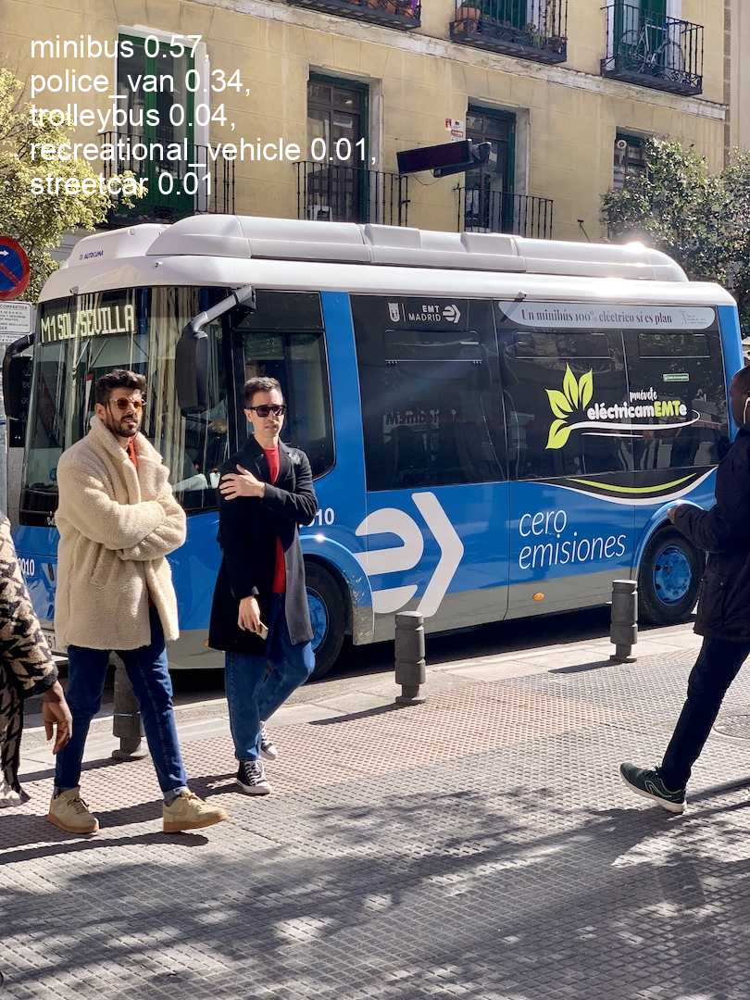

In [ ]:
model = YOLO("yolo11n-cls.pt")
results = model("https://ultralytics.com/images/bus.jpg")  # inference on image
# results = model(["im1.jpg","im2.jpg"], stream=True)  # inference on a set of image

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen

### ***Pose***

#### Train

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-pose.yaml")  # build a new model from YAML
model = YOLO("yolo11n-pose.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n-pose.yaml").load("yolo11n-pose.pt")  # build from YAML and transfer weights

# Train the model with 1 GPU
results = model.train(data="coco8-pose.yaml", epochs=100, imgsz=640)
# # Train the model with 2 GPUs
# results = model.train(data="coco8-pose.yaml", epochs=100, imgsz=640, device=[0, 1])
# # Train the model with MPS (recommanded for Apple user)
# results = model.train(data="coco8-pose.yaml", epochs=100, imgsz=640, device="mps")

#### Validation

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)  # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75
print(metrics.box.maps)  # a list contains map50-95 of each category

#### Test


WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
1/1: https://www.gannett-cdn.com/authoring/2006/09/22/NTEG/ghows-WT-a4cda843-ce68-4668-a6a2-96b7b2536fc5-48d1e039.jpeg?crop=799,451,x0,y39&width=2560... Success ✅ (inf frames of shape 2560x1445 at 25.00 FPS)

WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.
0: 384x640 5 persons, 12.2ms


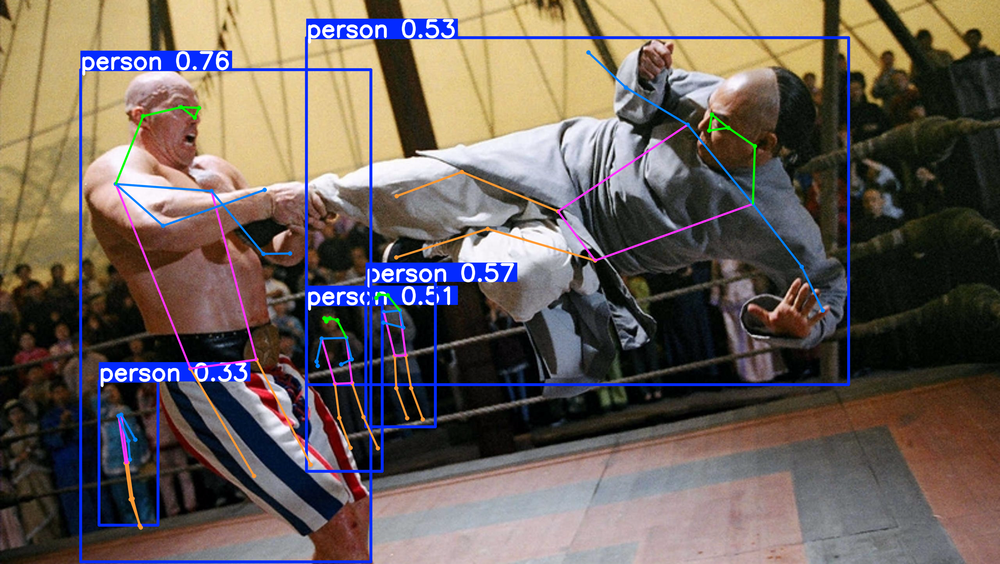

In [ ]:
model = YOLO("yolo11n-pose.pt")
results = model("https://www.gannett-cdn.com/authoring/2006/09/22/NTEG/ghows-WT-a4cda843-ce68-4668-a6a2-96b7b2536fc5-48d1e039.jpeg?crop=799,451,x0,y39&width=2560",stream=True)  # inference on image
# results = model(["im1.jpg","im2.jpg"], stream=True)  # inference on a set of image

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    # result.save(filename='result_pose')  # save to disk

### ***Oriented bounding box***

#### Train

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-obb.yaml")  # build a new model from YAML
model = YOLO("yolo11n-obb.pt")  # load a pretrained model (recommended for training)
model = YOLO("yolo11n-obb.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

# Train the model with 1 GPU
results = model.train(data="dota8.yaml", epochs=100, imgsz=640)
# # Train the model with 2 GPUs
# results = model.train(data="dota8.yaml", epochs=100, imgsz=640, device=[0, 1])
# # Train the model with MPS (recommanded for Apple user)
# results = model.train(data="dota8.yaml", epochs=100, imgsz=640, device="mps")

#### Validation

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)  # map50-95
print(metrics.box.map50)  # map50
print(metrics.box.map75)  # map75
print(metrics.box.maps)  # a list contains map50-95 of each category

#### Test

In [ ]:
model = YOLO("yolo11n-obb.pt")
results = model("https://ultralytics.com/images/boats.jpg")  # inference on image
# results = model(["im1.jpg","im2.jpg"], stream=True)  # inference on a set of image

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen

100%|██████████| 5.53M/5.53M [00:00<00:00, 360MB/s]


100%|██████████| 190k/190k [00:00<00:00, 43.9MB/s]


image 1/1 /content/boats.jpg: 576x1024 52.3ms
